# 🛰️ **Water Body Segmentation — U-Net with Multispectral Data**

Pipeline:
1. Install & Imports
2. Load Raw Data
3. EDA (Exploratory Data Analysis)
4. Preprocessing
5. U-Net Architecture
6. Training
7. Evaluation

## **1. Install & Imports**

In [1]:
!pip install rasterio -qU

In [2]:
import os
import numpy as np
import pandas as pd
import rasterio
import warnings
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
import tensorflow.keras.backend as K

# Reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow version:", tf.__version__)
print("GPU available:", len(tf.config.list_physical_devices('GPU')) > 0)

2026-04-26 09:47:43.937254: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777196864.295463      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777196864.388248      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777196865.275476      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777196865.275525      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777196865.275527      55 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0
GPU available: True


## **2. Load Raw Data**

In [3]:
# ── Kaggle paths ──
IMAGES_PATH = "/kaggle/input/datasets/mahmoudosamahassan/satellite-dataset/satalite data/data/images"
LABELS_PATH = "/kaggle/input/datasets/mahmoudosamahassan/satellite-dataset/satalite data/data/labels"

# Band metadata
BAND_NAMES = [
    'Coastal Aerosol', 'Blue', 'Green', 'Red', 'NIR',
    'SWIR1', 'SWIR2', 'QA Band',
    'Merit DEM', 'Copernicus DEM',
    'ESA World Cover', 'Water Occurrence Prob'
]
N_BANDS = 12

In [4]:
# ── File discovery & pairing ──
all_image_files = sorted(os.listdir(IMAGES_PATH))
all_label_files = sorted(os.listdir(LABELS_PATH))

print(f"Raw image files found : {len(all_image_files)}")
print(f"Raw label files found : {len(all_label_files)}")

# Build stem sets to find mismatches
image_stems = {os.path.splitext(f)[0]: f for f in all_image_files}
label_stems = {os.path.splitext(f)[0]: f for f in all_label_files}

matched_stems = sorted(set(image_stems.keys()) & set(label_stems.keys()))
unmatched_images = set(image_stems.keys()) - set(label_stems.keys())
unmatched_labels = set(label_stems.keys()) - set(image_stems.keys())

print(f"\nMatched pairs         : {len(matched_stems)}")
print(f"Images without label  : {len(unmatched_images)}")
print(f"Labels without image  : {len(unmatched_labels)}")

if unmatched_images:
    print("\nSample unmatched images:", list(unmatched_images)[:5])
if unmatched_labels:
    print("Sample unmatched labels:", list(unmatched_labels)[:5])

# Use only matched pairs
image_files = [image_stems[s] for s in matched_stems]
label_files = [label_stems[s] for s in matched_stems]

Raw image files found : 306
Raw label files found : 456

Matched pairs         : 306
Images without label  : 0
Labels without image  : 150
Sample unmatched labels: ['25_172', '105_148', '8_73', '144_235', '120_305']


In [5]:
# ── Shape consistency check ──
print("Checking shapes of all files...")
bad_files = []
expected_shape = (N_BANDS, 128, 128)

for f in image_files:
    with rasterio.open(os.path.join(IMAGES_PATH, f)) as src:
        shape = (src.count, src.height, src.width)
        if shape != expected_shape:
            bad_files.append((f, shape))

if bad_files:
    print(f"WARNING: {len(bad_files)} files have unexpected shapes:")
    for fname, shp in bad_files:
        print(f"  {fname}: {shp}")
else:
    print(f"All {len(image_files)} image files have correct shape {expected_shape} ✓")

Checking shapes of all files...


/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)


All 306 image files have correct shape (12, 128, 128) ✓


In [6]:
# ── Load all data into memory ──
X_raw = np.zeros((len(image_files), 128, 128, N_BANDS), dtype=np.float32)
Y_raw = np.zeros((len(label_files), 128, 128, 1),       dtype=np.float32)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")   # suppress NotGeoreferencedWarning
    for i, (img_f, lbl_f) in enumerate(zip(image_files, label_files)):
        with rasterio.open(os.path.join(IMAGES_PATH, img_f)) as src:
            img = src.read().astype(np.float32)          # (bands, H, W)
            X_raw[i] = np.transpose(img, (1, 2, 0))     # → (H, W, bands)

        lbl = np.array(Image.open(os.path.join(LABELS_PATH, lbl_f)))
        Y_raw[i, :, :, 0] = (lbl > 0).astype(np.float32)  # ensure binary

print(f"X_raw shape : {X_raw.shape}")
print(f"Y_raw shape : {Y_raw.shape}")
print(f"Label unique values: {np.unique(Y_raw)}")

X_raw shape : (306, 128, 128, 12)
Y_raw shape : (306, 128, 128, 1)
Label unique values: [0. 1.]


## **3. EDA — Exploratory Data Analysis**

> **Before any preprocessing** to understand the raw data.

### 3.1 Label / Class Balance

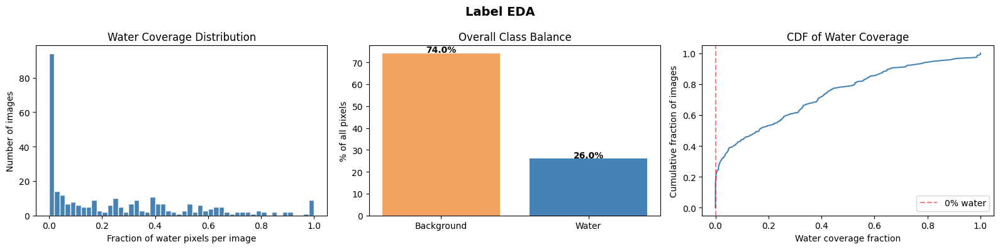

Images with NO water  : 45 (14.7%)
Images with <5% water : 117 (38.2%)
Images with >50% water: 66 (21.6%)
Mean water coverage   : 25.98%
Imbalance ratio (bg:water): 2.8:1


In [7]:
water_ratios = Y_raw.squeeze().reshape(len(Y_raw), -1).mean(axis=1)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Distribution of water coverage per image
axes[0].hist(water_ratios, bins=50, color='steelblue', edgecolor='white')
axes[0].set_xlabel("Fraction of water pixels per image")
axes[0].set_ylabel("Number of images")
axes[0].set_title("Water Coverage Distribution")

# Overall class balance
overall_water = water_ratios.mean()
axes[1].bar(['Background', 'Water'],
            [(1 - overall_water) * 100, overall_water * 100],
            color=['sandybrown', 'steelblue'])
axes[1].set_ylabel("% of all pixels")
axes[1].set_title("Overall Class Balance")
for bar, val in zip(axes[1].patches, [(1-overall_water)*100, overall_water*100]):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                 f'{val:.1f}%', ha='center', fontweight='bold')

# Cumulative distribution of water coverage
sorted_ratios = np.sort(water_ratios)
axes[2].plot(sorted_ratios, np.linspace(0, 1, len(sorted_ratios)), color='steelblue')
axes[2].axvline(0, color='red', linestyle='--', alpha=0.5, label='0% water')
axes[2].set_xlabel("Water coverage fraction")
axes[2].set_ylabel("Cumulative fraction of images")
axes[2].set_title("CDF of Water Coverage")
axes[2].legend()

plt.suptitle("Label EDA", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Images with NO water  : {(water_ratios == 0).sum()} ({(water_ratios == 0).mean():.1%})")
print(f"Images with <5% water : {(water_ratios < 0.05).sum()} ({(water_ratios < 0.05).mean():.1%})")
print(f"Images with >50% water: {(water_ratios > 0.5).sum()} ({(water_ratios > 0.5).mean():.1%})")
print(f"Mean water coverage   : {overall_water:.2%}")
print(f"Imbalance ratio (bg:water): {(1-overall_water)/overall_water:.1f}:1")

### 3.2 Per-Band Raw Statistics

In [8]:
stats = []
for b in range(N_BANDS):
    band_data = X_raw[..., b]
    nodata_count = (band_data < -9000).sum()
    stats.append({
        'Band': BAND_NAMES[b],
        'Min': band_data.min(),
        'Max': band_data.max(),
        'Mean': band_data.mean(),
        'Std': band_data.std(),
        'Median': np.median(band_data),
        '1st Pct': np.percentile(band_data, 1),
        '99th Pct': np.percentile(band_data, 99),
        'NoData % (<-9000)': nodata_count / band_data.size * 100
    })

stats_df = pd.DataFrame(stats).set_index('Band').round(2)
print("Raw Band Statistics:")
stats_df

Raw Band Statistics:


,Min,Max,Mean,Std,Median,1st Pct,99th Pct,NoData % (<-9000)
Band,,,,,,,,
Coastal Aerosol,-1393.0,6568.0,396.470001,270.070007,363.0,36.0,1123.0,0.00
Blue,-1169.0,9659.0,494.619995,325.980011,458.0,70.0,1357.0,0.00
Green,-722.0,11368.0,822.320007,418.119995,775.0,181.0,2000.0,0.00
Red,-684.0,12041.0,973.679993,586.700012,904.0,27.0,2680.0,0.00
NIR,-412.0,15841.0,2090.110107,1055.979980,2164.0,-28.0,4347.0,0.00
SWIR1,-335.0,15252.0,1964.050049,1191.420044,1987.0,-3.0,4624.0,0.00
SWIR2,-258.0,14647.0,1351.270020,961.760010,1251.0,3.0,3947.0,0.00
QA Band,64.0,255.0,102.739998,48.799999,64.0,64.0,224.0,0.00
Merit DEM,-9999.0,4245.0,141.800003,1364.979980,119.0,-9999.0,2431.0,1.55


### 3.3 Per-Band Histograms (Raw Values)

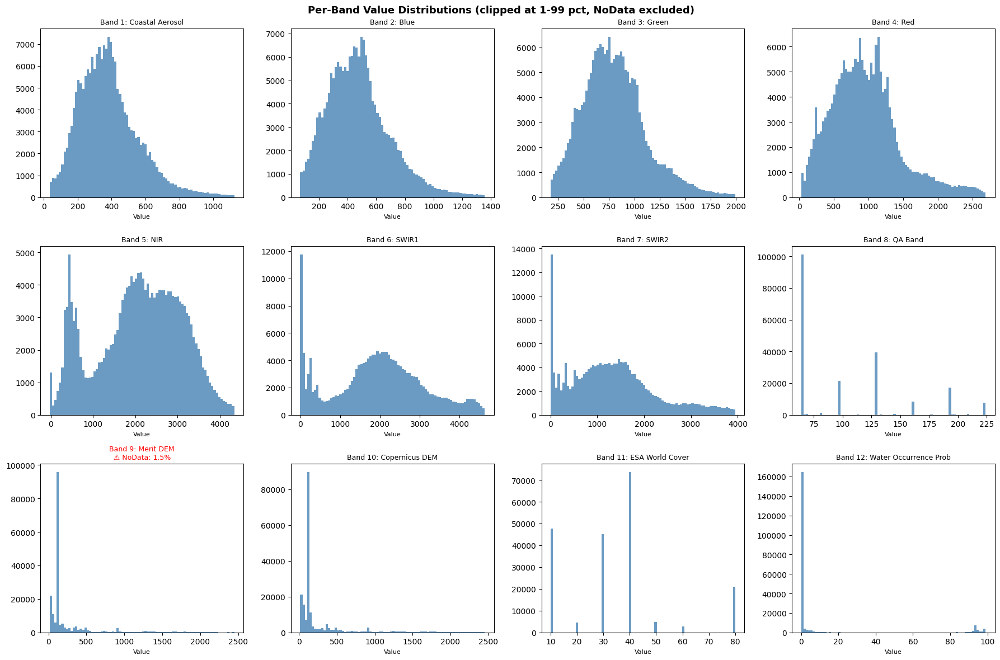

In [9]:
fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes = axes.flatten()

for b in range(N_BANDS):
    band_data = X_raw[..., b].flatten()
    sample = np.random.choice(band_data, size=min(200_000, len(band_data)), replace=False)

    # Clip extreme nodata for better visualization
    p1, p99 = np.percentile(sample[sample > -9000], [1, 99])
    sample_clipped = sample[(sample > -9000) & (sample >= p1) & (sample <= p99)]

    axes[b].hist(sample_clipped, bins=80, color='steelblue', alpha=0.8, edgecolor='none')
    axes[b].set_title(f"Band {b+1}: {BAND_NAMES[b]}", fontsize=9)
    axes[b].set_xlabel("Value", fontsize=8)

    # Mark nodata
    nodata_pct = (X_raw[..., b] < -9000).mean() * 100
    if nodata_pct > 0:
        axes[b].set_title(f"Band {b+1}: {BAND_NAMES[b]}\n⚠ NoData: {nodata_pct:.1f}%",
                          fontsize=9, color='red')

plt.suptitle("Per-Band Value Distributions (clipped at 1-99 pct, NoData excluded)",
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 3.4 Water vs Land Separation Per Band

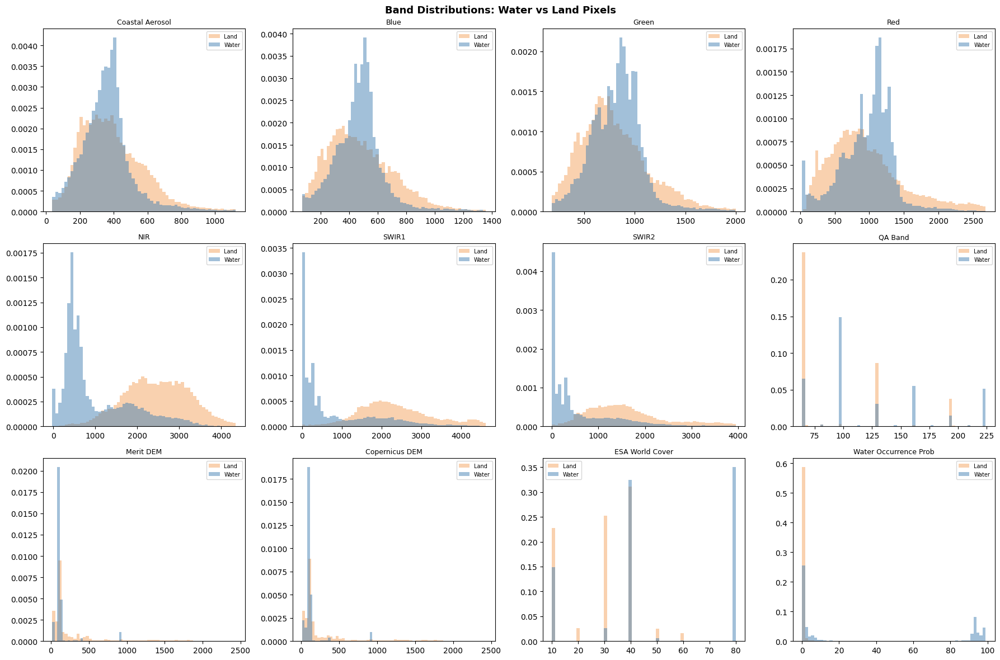

In [10]:
water_mask = Y_raw.squeeze().astype(bool)  # (N, 128, 128)

fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes = axes.flatten()

for b in range(N_BANDS):
    band_data = X_raw[..., b]

    water_vals = band_data[water_mask].flatten()
    land_vals  = band_data[~water_mask].flatten()

    # Remove nodata
    water_vals = water_vals[water_vals > -9000]
    land_vals  = land_vals[land_vals > -9000]

    # Clip to 1-99 pct for display
    all_valid = np.concatenate([water_vals, land_vals])
    p1, p99 = np.percentile(all_valid, [1, 99])

    water_clip = water_vals[(water_vals >= p1) & (water_vals <= p99)]
    land_clip  = land_vals[(land_vals >= p1) & (land_vals <= p99)]

    w_sample = np.random.choice(water_clip, size=min(30000, len(water_clip)), replace=False)
    l_sample = np.random.choice(land_clip,  size=min(30000, len(land_clip)),  replace=False)

    axes[b].hist(l_sample,  bins=60, alpha=0.5, label='Land',  color='sandybrown', density=True)
    axes[b].hist(w_sample,  bins=60, alpha=0.5, label='Water', color='steelblue',  density=True)
    axes[b].set_title(f"{BAND_NAMES[b]}", fontsize=9)
    axes[b].legend(fontsize=7)

plt.suptitle("Band Distributions: Water vs Land Pixels", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 3.5 Inter-Band Correlation

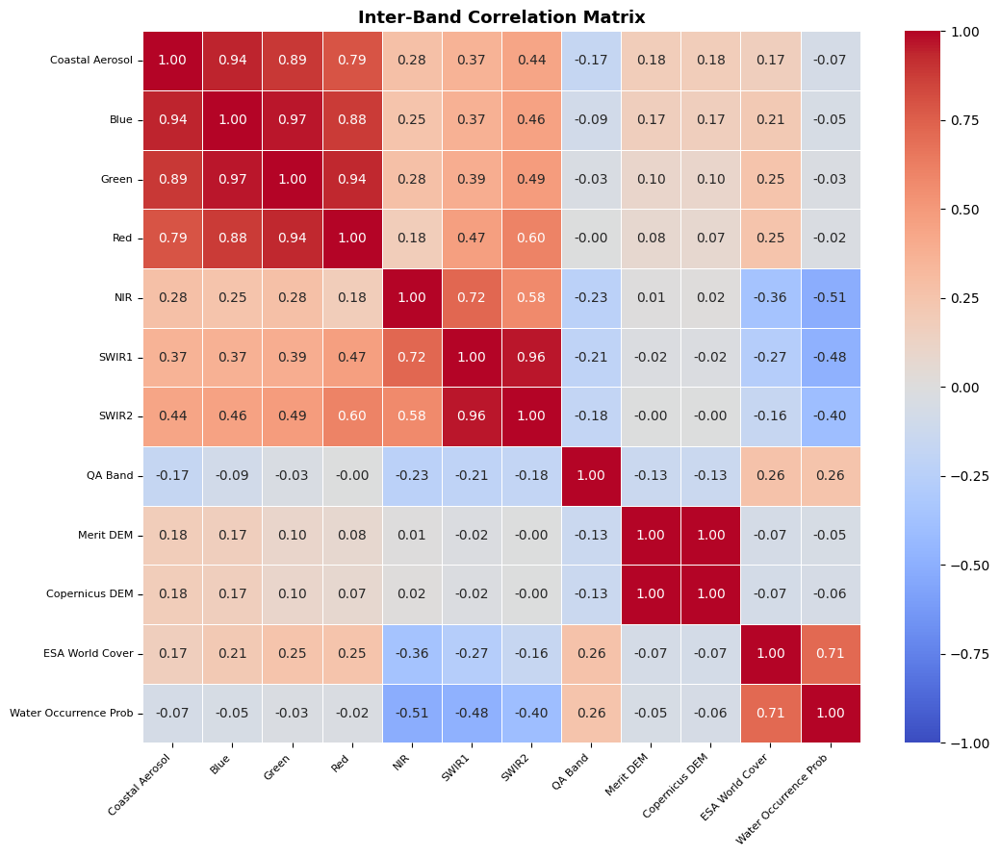

In [11]:
flat_X = X_raw.reshape(-1, N_BANDS)
# Remove rows with nodata
valid_mask = (flat_X > -9000).all(axis=1)
flat_X_valid = flat_X[valid_mask]

idx = np.random.choice(len(flat_X_valid), size=min(300_000, len(flat_X_valid)), replace=False)
sample = flat_X_valid[idx]

corr_matrix = np.corrcoef(sample.T)

plt.figure(figsize=(11, 9))
mask = np.zeros_like(corr_matrix, dtype=bool)
mask[np.triu_indices_from(mask, k=1)] = True  # upper triangle

sns.heatmap(corr_matrix,
            xticklabels=BAND_NAMES,
            yticklabels=BAND_NAMES,
            annot=True, fmt='.2f',
            cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5)
plt.title("Inter-Band Correlation Matrix", fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()

### 3.6 NDWI & MNDWI Separation Power
> NDWI "Normalized Difference Water Index" = (Green - NIR) / (Green + NIR + Epsilon) #Epsilon = 1e-8 => to avoid devide by zero
>> MNDWI "Modified NDWI" = (Green - SWIR) / (Green + SWIR + Epsilon) #Epsilon = 1e-8 => to avoid devide by zero)

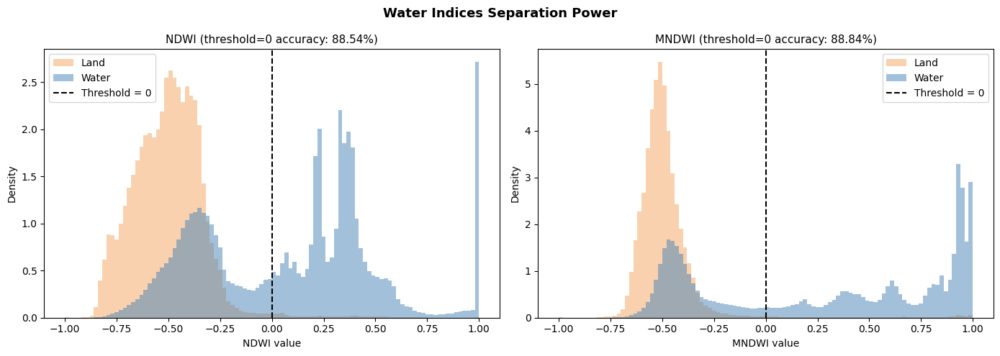

In [12]:
green = X_raw[..., 2].astype(np.float32)
nir   = X_raw[..., 4].astype(np.float32)
swir1 = X_raw[..., 5].astype(np.float32)

# Clip negative reflectances before computing indices
green = np.clip(green, 0, None)
nir   = np.clip(nir,   0, None)
swir1 = np.clip(swir1, 0, None)

ndwi  = (green - nir)   / (green + nir   + 1e-8)
mndwi = (green - swir1) / (green + swir1 + 1e-8)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, index_map, name in zip(axes, [ndwi, mndwi], ['NDWI', 'MNDWI']):
    w_vals = index_map[water_mask].flatten()
    l_vals = index_map[~water_mask].flatten()

    # Clip to [-1,1]
    w_vals = np.clip(w_vals, -1, 1)
    l_vals = np.clip(l_vals, -1, 1)

    ax.hist(l_vals, bins=100, alpha=0.5, label='Land',  color='sandybrown', density=True)
    ax.hist(w_vals, bins=100, alpha=0.5, label='Water', color='steelblue',  density=True)
    ax.axvline(0, color='black', linestyle='--', linewidth=1.5, label='Threshold = 0')

    # Simple accuracy at threshold=0
    all_vals   = np.concatenate([w_vals, l_vals])
    all_labels = np.concatenate([np.ones(len(w_vals)), np.zeros(len(l_vals))])
    preds = (all_vals > 0).astype(int)
    acc = (preds == all_labels).mean()

    ax.set_title(f"{name} (threshold=0 accuracy: {acc:.2%})", fontsize=11)
    ax.set_xlabel(f"{name} value")
    ax.set_ylabel("Density")
    ax.legend()

plt.suptitle("Water Indices Separation Power", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 3.7 Visual Inspection of Samples

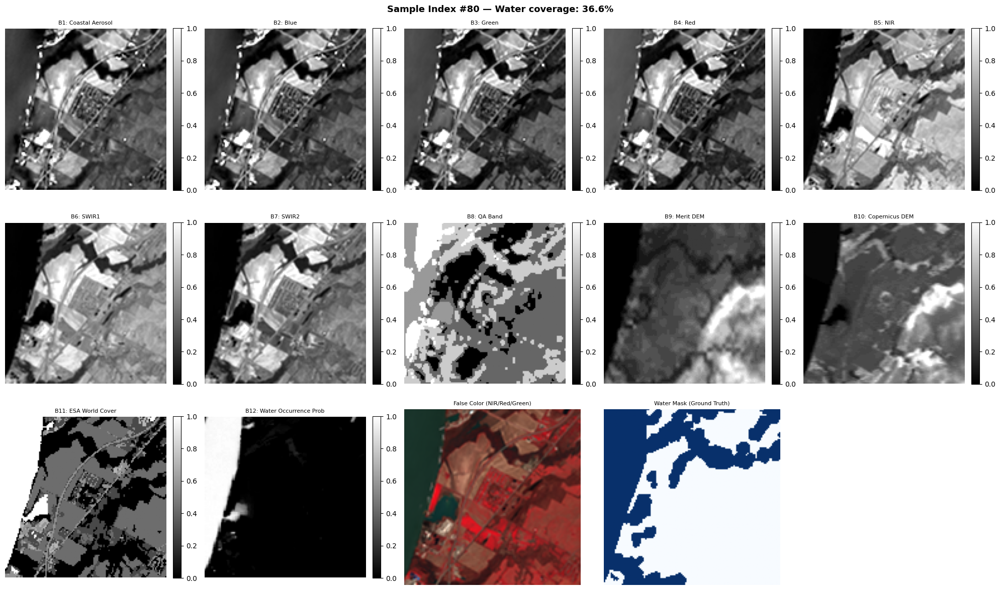

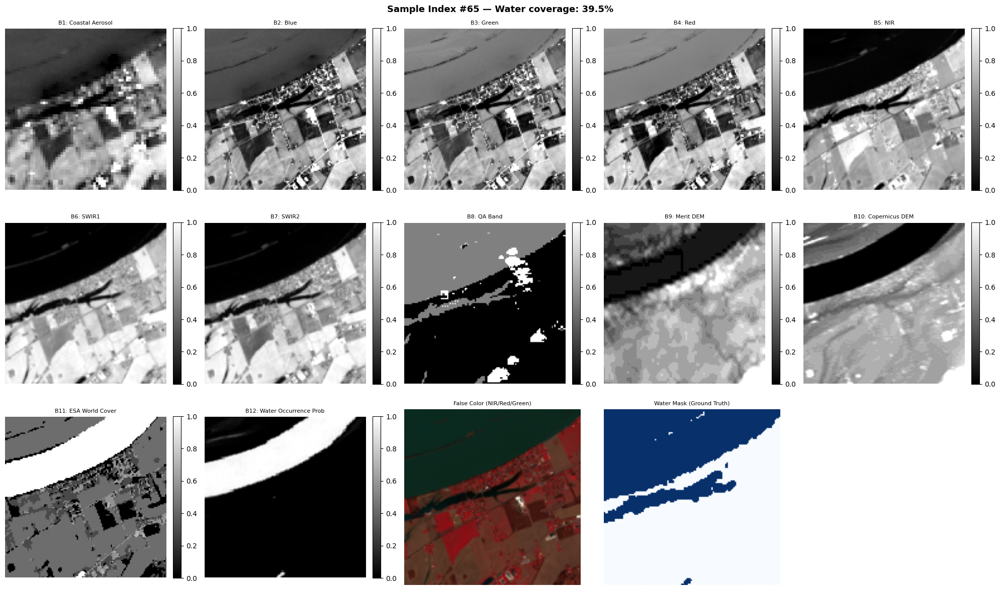

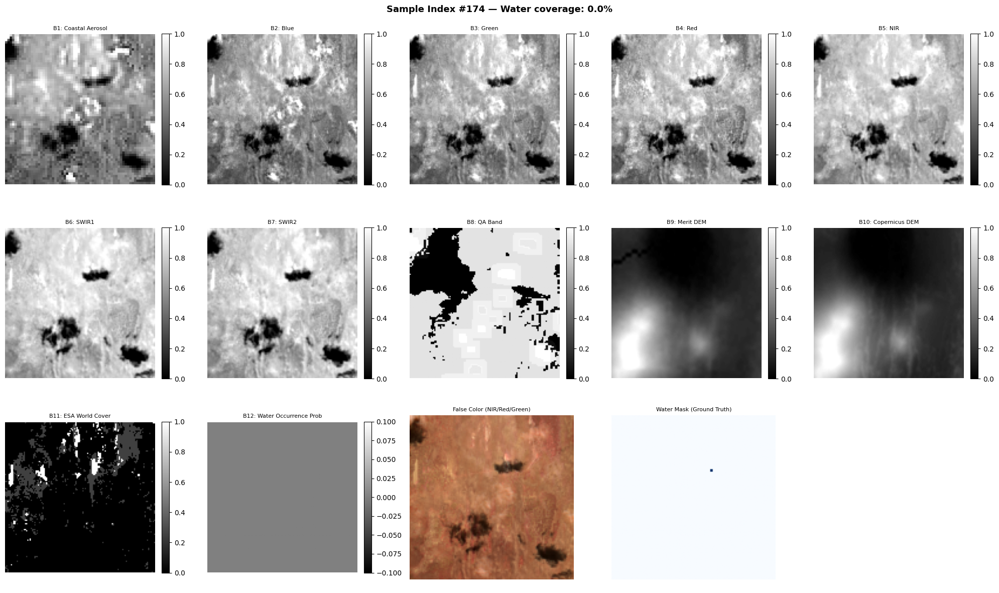

In [13]:
# Display all bands + label for one sample.
def visualize_sample(X, Y, idx, band_names=BAND_NAMES):
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    axes = axes.flatten()

    for b in range(N_BANDS):
        band = X[idx, :, :, b].copy()
        # Handle nodata
        nodata = band < -9000
        if nodata.any():
            band[nodata] = np.nan
        # Robust normalize for display (ignore nan)
        p1  = np.nanpercentile(band, 2)
        p99 = np.nanpercentile(band, 98)
        band_disp = np.clip((band - p1) / (p99 - p1 + 1e-8), 0, 1)
        im = axes[b].imshow(band_disp, cmap='gray')
        axes[b].set_title(f"B{b+1}: {band_names[b]}", fontsize=8)
        axes[b].axis('off')
        plt.colorbar(im, ax=axes[b], fraction=0.046, pad=0.04)

    # False-color RGB (NIR, Red, Green — useful for water detection)
    nir_r = np.clip(X[idx, :, :, 4], 0, 10000)
    red_r = np.clip(X[idx, :, :, 3], 0, 10000)
    grn_r = np.clip(X[idx, :, :, 2], 0, 10000)
    rgb = np.stack([nir_r, red_r, grn_r], axis=-1).astype(float)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    axes[12].imshow(rgb)
    axes[12].set_title("False Color (NIR/Red/Green)", fontsize=8)
    axes[12].axis('off')

    # Label
    axes[13].imshow(Y[idx].squeeze(), cmap='Blues', vmin=0, vmax=1)
    axes[13].set_title("Water Mask (Ground Truth)", fontsize=8)
    axes[13].axis('off')

    axes[14].axis('off')

    plt.suptitle(f"Sample Index #{idx} — Water coverage: {Y[idx].mean():.1%}",
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()


# Visualize 3 random samples
sample_indices = np.random.choice(len(X_raw), 3, replace=False)
for i in sample_indices:
    visualize_sample(X_raw, Y_raw, i)

### 3.8 QA Band — Bitmask Analysis

QA Band Analysis:
  Cloud pixels         : 0.11%
  Cloud shadow pixels  : 1.62%
  Adjacent cloud pixels: 19.43%
  Any bad pixel        : 20.65%
  Clean pixels         : 79.35%


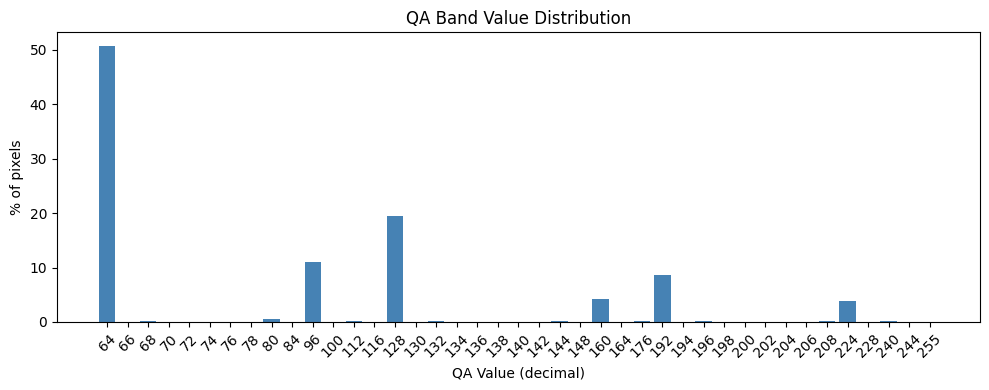

In [14]:
qa = X_raw[..., 7].astype(int)

# HLS QA bits: bit3=cloud, bit4=cloud_shadow, bit5=adjacent_cloud
cloud         = ((qa >> 3) & 1)
cloud_shadow  = ((qa >> 4) & 1)
adj_cloud     = ((qa >> 5) & 1)
any_bad       = ((cloud | cloud_shadow | adj_cloud) > 0)

print("QA Band Analysis:")
print(f"  Cloud pixels         : {cloud.mean():.2%}")
print(f"  Cloud shadow pixels  : {cloud_shadow.mean():.2%}")
print(f"  Adjacent cloud pixels: {adj_cloud.mean():.2%}")
print(f"  Any bad pixel        : {any_bad.mean():.2%}")
print(f"  Clean pixels         : {(~any_bad).mean():.2%}")

# QA value distribution
unique_qa, counts = np.unique(qa, return_counts=True)
plt.figure(figsize=(10, 4))
plt.bar(range(len(unique_qa)), counts / counts.sum() * 100, color='steelblue')
plt.xticks(range(len(unique_qa)), unique_qa, rotation=45)
plt.xlabel("QA Value (decimal)")
plt.ylabel("% of pixels")
plt.title("QA Band Value Distribution")
plt.tight_layout()
plt.show()

### 3.9 ESA World Cover — Category Distribution

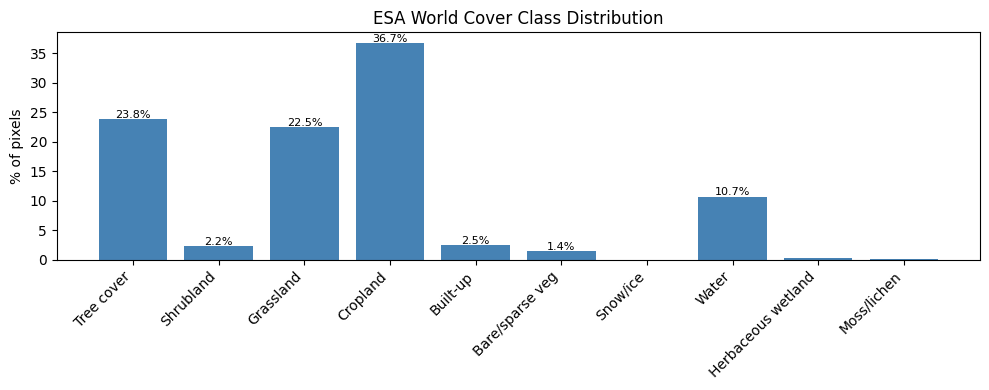

In [15]:
esa = X_raw[..., 10].astype(int)

# ESA World Cover class map
ESA_CLASSES = {
    10: 'Tree cover', 20: 'Shrubland', 30: 'Grassland',
    40: 'Cropland',   50: 'Built-up',  60: 'Bare/sparse veg',
    70: 'Snow/ice',   80: 'Water',     90: 'Herbaceous wetland',
    95: 'Mangroves',  100: 'Moss/lichen'
}

unique_esa, esa_counts = np.unique(esa, return_counts=True)
labels = [ESA_CLASSES.get(v, f'Unknown({v})') for v in unique_esa]

plt.figure(figsize=(10, 4))
bars = plt.bar(labels, esa_counts / esa_counts.sum() * 100, color='steelblue')
plt.xticks(rotation=45, ha='right')
plt.ylabel("% of pixels")
plt.title("ESA World Cover Class Distribution")
for bar, val in zip(bars, esa_counts / esa_counts.sum() * 100):
    if val > 1:
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
                 f'{val:.1f}%', ha='center', fontsize=8)
plt.tight_layout()
plt.show()

## **4. Preprocessing**

Each band group is treated according to its physical meaning.

In [16]:
def preprocess(X_raw, fit_stats=None):
    """
    Full preprocessing pipeline for the 12-band satellite data.
    
    Band groups:
      0–6  : Spectral reflectance (Coastal, Blue, Green, Red, NIR, SWIR1, SWIR2)
      7    : QA bitmask  → decoded to binary bad-pixel flag
      8–9  : DEM (Merit, Copernicus) → fix NoData (-9999), then normalize
      10   : ESA World Cover → binary water flag (class 80)
      11   : Water occurrence probability → divide by 100

    Extra engineered channels appended:
      12   : NDWI  = (Green - NIR)   / (Green + NIR   + ε)
      13   : MNDWI = (Green - SWIR1) / (Green + SWIR1 + ε)

    If fit_stats is None  → compute stats from this X (use on train set).
    If fit_stats provided → apply pre-computed stats (use on val/test sets).

    Returns: X_processed (N, H, W, 14), fit_stats dict
    """
    X = X_raw.copy().astype(np.float32)
    N, H, W, _ = X.shape

    # ── 1. Spectral reflectance bands (0–6) ───────────────────────────────────
    REFL_BANDS = list(range(7))
    REFL_CLIP  = (0.0, 10000.0)   # valid surface reflectance range for HLS

    # Clip first (removes negative artifacts & sensor saturation)
    for b in REFL_BANDS:
        X[..., b] = np.clip(X[..., b], *REFL_CLIP)

    # Per-band standardization (zero mean, unit std) — computed on train only
    if fit_stats is None:
        refl_mean = np.zeros(len(REFL_BANDS), dtype=np.float32)
        refl_std  = np.zeros(len(REFL_BANDS), dtype=np.float32)
        for i, b in enumerate(REFL_BANDS):
            refl_mean[i] = X[..., b].mean()
            refl_std[i]  = X[..., b].std() + 1e-8
    else:
        refl_mean = fit_stats['refl_mean']
        refl_std  = fit_stats['refl_std']

    for i, b in enumerate(REFL_BANDS):
        X[..., b] = (X[..., b] - refl_mean[i]) / refl_std[i]

    # ── 2. QA band (7) → binary bad-pixel flag ────────────────────────────────
    qa_int = X_raw[..., 7].astype(np.int32)
    cloud        = ((qa_int >> 3) & 1).astype(np.float32)
    cloud_shadow = ((qa_int >> 4) & 1).astype(np.float32)
    adj_cloud    = ((qa_int >> 5) & 1).astype(np.float32)
    bad_pixel    = np.clip(cloud + cloud_shadow + adj_cloud, 0, 1)
    X[..., 7]    = bad_pixel   # 1 = bad pixel, 0 = clean

    # ── 3. DEM bands (8–9) → fix NoData, then normalize ──────────────────────
    DEM_BANDS = [8, 9]

    if fit_stats is None:
        dem_fill = {}
        dem_min  = {}
        dem_max  = {}

    for b in DEM_BANDS:
        nodata_mask = X[..., b] < -9000

        if fit_stats is None:
            valid_vals = X[..., b][~nodata_mask]
            fill_val   = float(np.median(valid_vals)) if valid_vals.size > 0 else 0.0
            b_min      = float(valid_vals.min()) if valid_vals.size > 0 else 0.0
            b_max      = float(valid_vals.max()) if valid_vals.size > 0 else 1.0
            dem_fill[b] = fill_val
            dem_min[b]  = b_min
            dem_max[b]  = b_max
        else:
            fill_val = fit_stats['dem_fill'][b]
            b_min    = fit_stats['dem_min'][b]
            b_max    = fit_stats['dem_max'][b]

        X[..., b][nodata_mask] = fill_val
        X[..., b] = (X[..., b] - b_min) / (b_max - b_min + 1e-8)
        X[..., b] = np.clip(X[..., b], 0, 1)

    # ── 4. ESA World Cover (10) → binary water class ──────────────────────────
    WATER_CLASS = 80
    X[..., 10] = (X_raw[..., 10].astype(int) == WATER_CLASS).astype(np.float32)

    # ── 5. Water occurrence probability (11) → [0, 1] ─────────────────────────
    X[..., 11] = np.clip(X_raw[..., 11] / 100.0, 0, 1)

    # ── 6. Engineered water indices ───────────────────────────────────────────
    # Use clipped raw reflectance values (pre-standardization)
    raw_green = np.clip(X_raw[..., 2], 0, 10000).astype(np.float32)
    raw_nir   = np.clip(X_raw[..., 4], 0, 10000).astype(np.float32)
    raw_swir1 = np.clip(X_raw[..., 5], 0, 10000).astype(np.float32)

    ndwi  = (raw_green - raw_nir)   / (raw_green + raw_nir   + 1e-8)
    mndwi = (raw_green - raw_swir1) / (raw_green + raw_swir1 + 1e-8)

    ndwi  = np.clip(ndwi,  -1, 1).astype(np.float32)
    mndwi = np.clip(mndwi, -1, 1).astype(np.float32)

    # Stack engineered channels
    X = np.concatenate([
        X,
        ndwi[..., np.newaxis],
        mndwi[..., np.newaxis]
    ], axis=-1)  # → (N, H, W, 14)

    # Build stats dict for reuse on val/test
    if fit_stats is None:
        fit_stats = {
            'refl_mean': refl_mean,
            'refl_std':  refl_std,
            'dem_fill':  dem_fill,
            'dem_min':   dem_min,
            'dem_max':   dem_max,
        }

    return X, fit_stats

In [17]:
# ── Train / Val / Test split BEFORE preprocessing ──
# Important: fit normalization stats on train only

X_train_raw, X_temp_raw, Y_train, Y_temp = train_test_split(
    X_raw, Y_raw, test_size=0.2, random_state=SEED
)
X_val_raw, X_test_raw, Y_val, Y_test = train_test_split(
    X_temp_raw, Y_temp, test_size=0.5, random_state=SEED
)

print(f"Train: {X_train_raw.shape[0]} samples")
print(f"Val  : {X_val_raw.shape[0]} samples")
print(f"Test : {X_test_raw.shape[0]} samples")

Train: 244 samples
Val  : 31 samples
Test : 31 samples


In [18]:
# ── Apply preprocessing ──
X_train, fit_stats = preprocess(X_train_raw, fit_stats=None)      # fit on train
X_val,   _         = preprocess(X_val_raw,   fit_stats=fit_stats)  # apply to val
X_test,  _         = preprocess(X_test_raw,  fit_stats=fit_stats)  # apply to test

N_CHANNELS = X_train.shape[-1]  # 14 (12 original + NDWI + MNDWI)

print(f"X_train shape: {X_train.shape}")
print(f"X_val   shape: {X_val.shape}")
print(f"X_test  shape: {X_test.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"Total channels: {N_CHANNELS}")

X_train shape: (244, 128, 128, 14)
X_val   shape: (31, 128, 128, 14)
X_test  shape: (31, 128, 128, 14)
Y_train shape: (244, 128, 128, 1)
Total channels: 14


In [19]:
import pickle
with open('/kaggle/working/fit_stats.pkl', 'wb') as f:
    pickle.dump(fit_stats, f)
print("fit_stats saved ✓")

fit_stats saved ✓


In [20]:
# ── Verify preprocessing results ──
PROC_BAND_NAMES = BAND_NAMES + ['NDWI', 'MNDWI']

proc_stats = []
for b in range(N_CHANNELS):
    proc_stats.append({
        'Band': PROC_BAND_NAMES[b],
        'Min':  X_train[..., b].min().round(4),
        'Max':  X_train[..., b].max().round(4),
        'Mean': X_train[..., b].mean().round(4),
        'Std':  X_train[..., b].std().round(4),
        'NaN?': np.isnan(X_train[..., b]).any()
    })

pd.DataFrame(proc_stats).set_index('Band')

,Min,Max,Mean,Std,NaN?
Band,,,,,
Coastal Aerosol,-1.5154,23.173500,0.0000,1.0000,False
Blue,-1.5506,28.258801,0.0000,1.0000,False
Green,-1.9923,21.857300,0.0000,1.0000,False
Red,-1.6692,15.237800,0.0000,1.0000,False
NIR,-1.9593,7.347400,-0.0000,1.0000,False
SWIR1,-1.6289,6.617700,-0.0000,1.0000,False
SWIR2,-1.3917,8.835000,0.0000,1.0000,False
QA Band,0.0000,1.000000,0.2147,0.4106,False
Merit DEM,0.0000,1.000000,0.0645,0.1106,False


### 4.1 Class Imbalance — Compute Weights

In [21]:
total_pixels  = Y_train.size
water_pixels  = Y_train.sum()
bg_pixels     = total_pixels - water_pixels
water_ratio   = water_pixels / total_pixels

print(f"Training set — water pixel ratio: {water_ratio:.2%}")
print(f"Imbalance ratio (bg:water)       : {bg_pixels/water_pixels:.1f}:1")

# Pos weight for weighted loss: (# negative samples) / (# positive samples)
POS_WEIGHT = float(bg_pixels / (water_pixels + 1e-8))
print(f"pos_weight for weighted BCE      : {POS_WEIGHT:.2f}")

Training set — water pixel ratio: 26.87%
Imbalance ratio (bg:water)       : 2.7:1
pos_weight for weighted BCE      : 2.72


## **5. Model — U-Net Architecture**

### 5.1 Loss Functions & Metrics

In [22]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def weighted_bce(y_true, y_pred, pos_weight=POS_WEIGHT):
    """Binary cross-entropy weighted by class imbalance."""
    # binary_crossentropy reduces last dim → shape [B,H,W], so squeeze y_true to match
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)  # [B,H,W]
    weight_map = tf.squeeze(y_true, axis=-1) * pos_weight + (1 - tf.squeeze(y_true, axis=-1))
    return K.mean(weight_map * bce)


def combined_loss(y_true, y_pred):
    """Weighted BCE + Dice — handles imbalance from both sides."""
    return weighted_bce(y_true, y_pred) + dice_loss(y_true, y_pred)


def iou_metric(y_true, y_pred):
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred_bin)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_bin) - intersection
    return (intersection + 1e-6) / (union + 1e-6)


def precision_metric(y_true, y_pred):
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    tp = tf.reduce_sum(y_true * y_pred_bin)
    fp = tf.reduce_sum((1 - y_true) * y_pred_bin)
    return (tp + 1e-6) / (tp + fp + 1e-6)


def recall_metric(y_true, y_pred):
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    tp = tf.reduce_sum(y_true * y_pred_bin)
    fn = tf.reduce_sum(y_true * (1 - y_pred_bin))
    return (tp + 1e-6) / (tp + fn + 1e-6)


def f1_metric(y_true, y_pred):
    p = precision_metric(y_true, y_pred)
    r = recall_metric(y_true, y_pred)
    return 2 * p * r / (p + r + 1e-6)


METRICS = [iou_metric, precision_metric, recall_metric, f1_metric]

### 5.2 U-Net Blocks

In [23]:
def conv_block(inputs, num_filters, dropout_rate=0.0):
    """Double conv + BN + ReLU block."""
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same', use_bias=False)(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same', use_bias=False)(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)

    if dropout_rate > 0:
        x = tf.keras.layers.Dropout(dropout_rate)(x)

    return x


def encoder_block(inputs, num_filters, dropout_rate=0.0):
    x = conv_block(inputs, num_filters, dropout_rate)
    p = tf.keras.layers.MaxPool2D((2, 2))(x)
    return x, p


def decoder_block(inputs, skip_features, num_filters):
    x = tf.keras.layers.Conv2DTranspose(num_filters, 2, strides=2, padding='same')(inputs)
    x = tf.keras.layers.Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

### 5.3 U-Net Model

In [24]:
def build_unet(input_shape=(128, 128, 14), num_classes=1):
    inputs = tf.keras.layers.Input(input_shape)

    # ── Encoder ──
    s1, p1 = encoder_block(inputs, 32,  dropout_rate=0.1)
    s2, p2 = encoder_block(p1,     64,  dropout_rate=0.1)
    s3, p3 = encoder_block(p2,     128, dropout_rate=0.2)
    s4, p4 = encoder_block(p3,     256, dropout_rate=0.2)

    # ── Bottleneck (8×8) ──
    b = conv_block(p4, 512, dropout_rate=0.3)

    # ── Decoder ──
    d1 = decoder_block(b,  s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    # ── Output ──
    outputs = tf.keras.layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(d4)

    return tf.keras.models.Model(inputs, outputs, name='UNet')


model = build_unet(input_shape=(128, 128, N_CHANNELS))
model.summary()

I0000 00:00:1777196931.325069      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1777196931.330956      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 14)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      4,032 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128, 128,  │          0 │ activation_1[0][… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ dropout[0][0]     │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │     36,864 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64, 64,    │          0 │ activation_3[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ dropout_1[0][0] 

 Total params: 7,772,097 (29.65 MB)

 Trainable params: 7,766,209 (29.63 MB)

 Non-trainable params: 5,888 (23.00 KB)

## **6. Training**

### 6.1 Data Augmentation

In [25]:
def augment_sample(image, mask):
    """
    Apply identical random augmentation to both image and mask.
    Works on single (H, W, C) image and (H, W, 1) mask.
    """
    # Stack so the same random transform applies to both
    combined = tf.concat([image, mask], axis=-1)  # (H, W, C+1)

    # Random horizontal flip
    combined = tf.image.random_flip_left_right(combined)

    # Random vertical flip
    combined = tf.image.random_flip_up_down(combined)

    # Random 90° rotation
    k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    combined = tf.image.rot90(combined, k)

    # Split back
    n_bands = image.shape[-1]
    image_aug = combined[..., :n_bands]
    mask_aug  = combined[..., n_bands:]

    return image_aug, mask_aug


def build_dataset(X, Y, batch_size=16, augment=False, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((X, Y))

    if shuffle:
        ds = ds.shuffle(buffer_size=len(X), seed=SEED)

    if augment:
        ds = ds.map(augment_sample,
                    num_parallel_calls=tf.data.AUTOTUNE)

    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds


BATCH_SIZE = 16

train_ds = build_dataset(X_train, Y_train, batch_size=BATCH_SIZE, augment=True,  shuffle=True)
val_ds   = build_dataset(X_val,   Y_val,   batch_size=BATCH_SIZE, augment=False, shuffle=False)
test_ds  = build_dataset(X_test,  Y_test,  batch_size=BATCH_SIZE, augment=False, shuffle=False)

print("Train dataset:", train_ds)
print("Val   dataset:", val_ds)

Train dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 14), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>
Val   dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 14), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>


### 6.2 Compile & Callbacks

In [26]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=combined_loss,
    metrics=METRICS
)

callbacks = [
    # Save best model based on val IoU
    tf.keras.callbacks.ModelCheckpoint(
        filepath='/kaggle/working/best_unet.keras',
        monitor='val_iou_metric',
        mode='max',
        save_best_only=True,
        verbose=1
    ),
    # Stop early if val IoU doesn't improve
    tf.keras.callbacks.EarlyStopping(
        monitor='val_iou_metric',
        mode='max',
        patience=20,
        restore_best_weights=True,
        verbose=1
    ),
    # Reduce LR when val loss plateaus
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=8,
        min_lr=1e-7,
        verbose=1
    ),
    # Log to CSV for later analysis
    tf.keras.callbacks.CSVLogger('/kaggle/working/training_log.csv')
]

### 6.3 Train

In [27]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=callbacks
)

Epoch 1/100


I0000 00:00:1777196944.579363     155 service.cc:152] XLA service 0x7ede6c03afb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1777196944.579408     155 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1777196944.579414     155 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1777196946.430440     155 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-04-26 09:49:12.127261: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-26 09:49:12.406630: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-26 09:49:12.680326: E external/local_xl

 1/16 ━━━━━━━━━━━━━━━━━━━━ 8:05 32s/step - f1_metric: 0.5428 - iou_metric: 0.3725 - loss: 1.6621 - precision_metric: 0.3961 - recall_metric: 0.8621

I0000 00:00:1777196967.383869     155 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - f1_metric: 0.4464 - iou_metric: 0.2916 - loss: 1.5882 - precision_metric: 0.3017 - recall_metric: 0.9126

2026-04-26 09:49:33.406586: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-26 09:49:33.680998: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-26 09:49:34.306289: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-26 09:49:34.593347: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-26 09:49:34.877691: E external/local_xla/xla/stream_

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - f1_metric: 0.4473 - iou_metric: 0.2925 - loss: 1.5809 - precision_metric: 0.3026 - recall_metric: 0.9132  
Epoch 1: val_iou_metric improved from -inf to 0.31276, saving model to /kaggle/working/best_unet.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - f1_metric: 0.4481 - iou_metric: 0.2933 - loss: 1.5745 - precision_metric: 0.3033 - recall_metric: 0.9139 - val_f1_metric: 0.4753 - val_iou_metric: 0.3128 - val_loss: 1.5064 - val_precision_metric: 0.3211 - val_recall_metric: 0.9231 - learning_rate: 1.0000e-04
Epoch 2/100
15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - f1_metric: 0.6295 - iou_metric: 0.4653 - loss: 1.1469 - precision_metric: 0.4888 - recall_metric: 0.9154
Epoch 2: val_iou_metric improved from 0.31276 to 0.44087, saving model to /kaggle/working/best_unet.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - f1_metric: 0.6260 - iou_metric: 0.4624 - loss: 1.1482 - precision_metric: 0.4862 - recall_metric: 0.9141 - val_f1_metric: 0.6109 - val_iou_me

In [28]:
import json
with open('/kaggle/working/unet_history.json', 'w') as f:
    json.dump({k: [float(v) for v in vals] 
               for k, vals in history.history.items()}, f)
print("Training history saved ✓")

Training history saved ✓


### 6.4 Training Curves

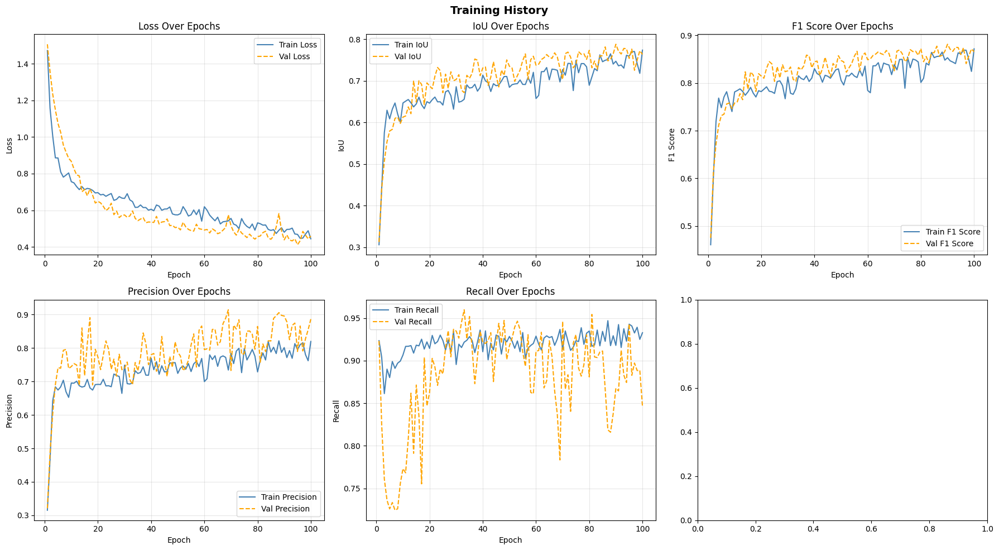

In [29]:
def plot_history(history):
    metrics_to_plot = [
        ('loss',             'Loss',       'lower-left'),
        ('iou_metric',       'IoU',        'lower-right'),
        ('f1_metric',        'F1 Score',   'lower-right'),
        ('precision_metric', 'Precision',  'lower-right'),
        ('recall_metric',    'Recall',     'lower-right'),
    ]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    epochs = range(1, len(history.history['loss']) + 1)

    for i, (metric, label, _) in enumerate(metrics_to_plot):
        if metric in history.history:
            axes[i].plot(epochs, history.history[metric],     label=f'Train {label}', color='steelblue')
            axes[i].plot(epochs, history.history[f'val_{metric}'], label=f'Val {label}',   color='orange', linestyle='--')
            axes[i].set_xlabel('Epoch')
            axes[i].set_ylabel(label)
            axes[i].set_title(f'{label} Over Epochs')
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)

    # Learning rate plot
    if 'lr' in history.history:
        axes[5].plot(epochs, history.history['lr'], color='green')
        axes[5].set_xlabel('Epoch')
        axes[5].set_ylabel('Learning Rate')
        axes[5].set_title('Learning Rate Schedule')
        axes[5].set_yscale('log')
        axes[5].grid(True, alpha=0.3)

    plt.suptitle('Training History', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_history(history)

## **7. Evaluation**

### 7.1 Test Set Metrics

In [30]:
# Load best saved model
best_model = tf.keras.models.load_model(
    '/kaggle/working/best_unet.keras',
    custom_objects={
        'combined_loss':     combined_loss,
        'iou_metric':        iou_metric,
        'precision_metric':  precision_metric,
        'recall_metric':     recall_metric,
        'f1_metric':         f1_metric,
    }
)

results = best_model.evaluate(test_ds, verbose=1)
metric_names = ['Loss', 'IoU', 'Precision', 'Recall', 'F1']

print("\n" + "="*40)
print("TEST SET RESULTS (Best Model)")
print("="*40)
for name, val in zip(metric_names, results):
    print(f"  {name:<12}: {val:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - f1_metric: 0.8753 - iou_metric: 0.7783 - loss: 0.4675 - precision_metric: 0.8998 - recall_metric: 0.8527

TEST SET RESULTS (Best Model)
  Loss        : 0.4609
  IoU         : 0.7803
  Precision   : 0.8952
  Recall      : 0.8594
  F1          : 0.8766


### 7.2 Full Classification Report + Confusion Matrix

Classification Report at threshold=0.5:
              precision    recall  f1-score   support

  Background     0.9645    0.9740    0.9693    404527
       Water     0.8943    0.8599    0.8768    103377

    accuracy                         0.9508    507904
   macro avg     0.9294    0.9170    0.9230    507904
weighted avg     0.9503    0.9508    0.9504    507904



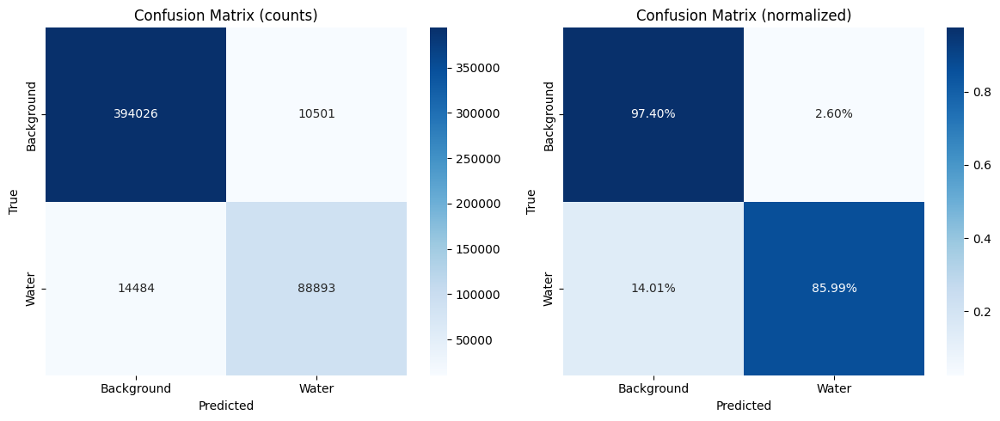

In [31]:
Y_pred_prob = best_model.predict(X_test, verbose=0)
Y_pred_bin  = (Y_pred_prob > 0.5).astype(np.uint8)

y_true_flat = Y_test.flatten().astype(int)
y_pred_flat = Y_pred_bin.flatten().astype(int)

print("Classification Report at threshold=0.5:")
print(classification_report(y_true_flat, y_pred_flat,
                             target_names=['Background', 'Water'],
                             digits=4))

# Confusion matrix
cm      = confusion_matrix(y_true_flat, y_pred_flat)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, data, title, fmt in zip(
        axes,
        [cm, cm_norm],
        ['Confusion Matrix (counts)', 'Confusion Matrix (normalized)'],
        ['d', '.2%']):
    sns.heatmap(data, annot=True, fmt=fmt, cmap='Blues', ax=ax,
                xticklabels=['Background', 'Water'],
                yticklabels=['Background', 'Water'])
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_title(title)

plt.tight_layout()
plt.show()

### 7.3 Threshold Sensitivity Analysis

Best threshold by F1 : 0.45
  → F1  = 0.8780
  → IoU = 0.7826


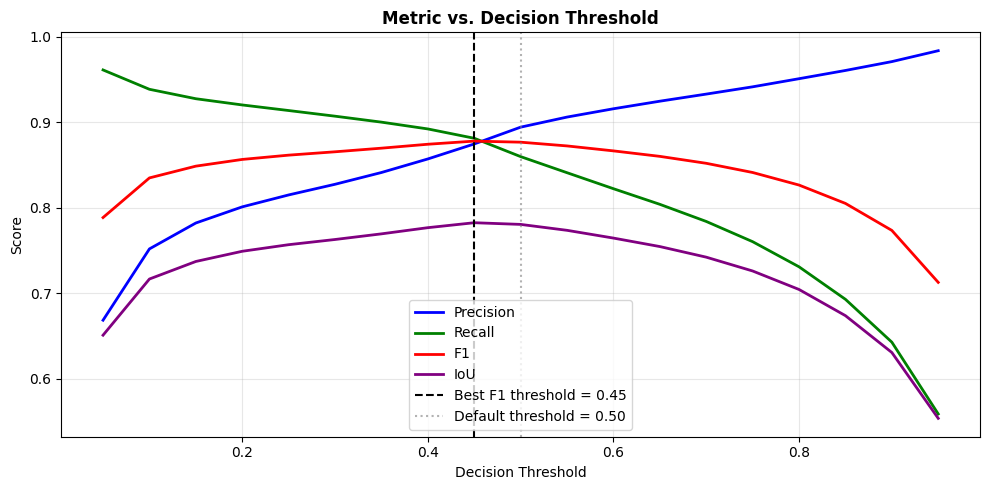


Classification Report at Best Threshold (0.45):
              precision    recall  f1-score   support

  Background     0.9696    0.9677    0.9687    404527
       Water     0.8747    0.8814    0.8780    103377

    accuracy                         0.9502    507904
   macro avg     0.9222    0.9246    0.9234    507904
weighted avg     0.9503    0.9502    0.9502    507904



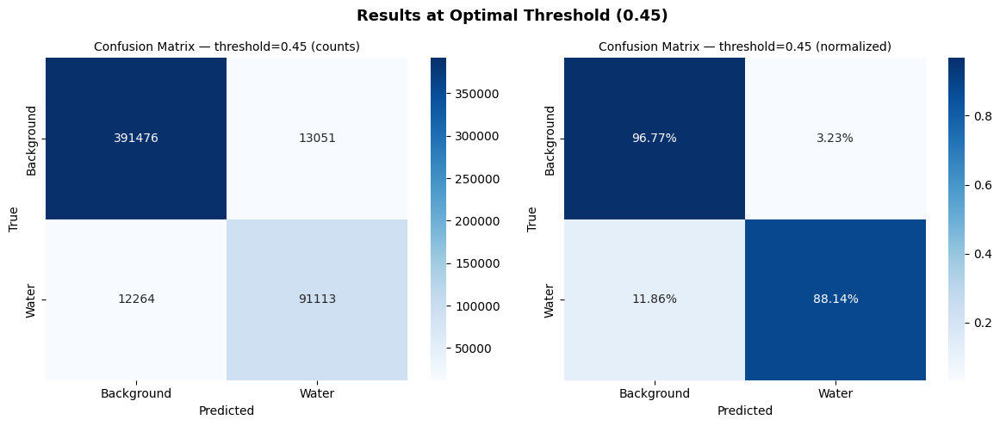

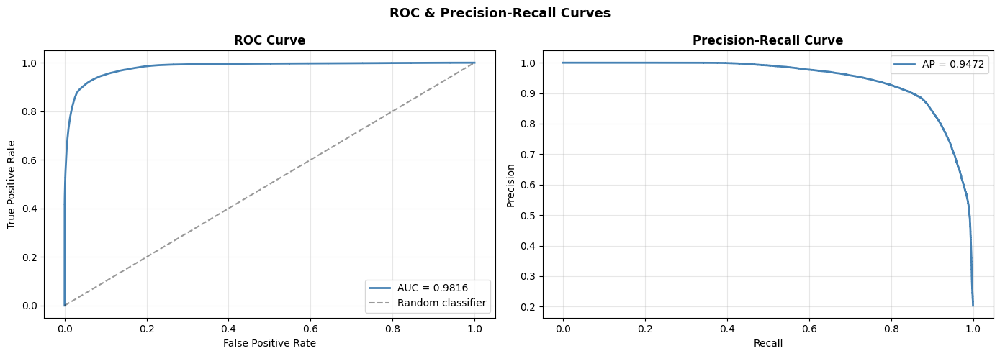

ROC-AUC Score          : 0.9816
Average Precision (AP) : 0.9472


In [32]:
thresholds    = np.arange(0.05, 0.96, 0.05)   # wider range than before
thresh_results = []

for t in thresholds:
    preds = (Y_pred_prob.flatten() > t).astype(int)
    tp = ((preds == 1) & (y_true_flat == 1)).sum()
    fp = ((preds == 1) & (y_true_flat == 0)).sum()
    fn = ((preds == 0) & (y_true_flat == 1)).sum()
    tn = ((preds == 0) & (y_true_flat == 0)).sum()

    prec = tp / (tp + fp + 1e-8)
    rec  = tp / (tp + fn + 1e-8)
    f1   = 2 * prec * rec / (prec + rec + 1e-8)
    iou  = tp / (tp + fp + fn + 1e-8)
    thresh_results.append({'Threshold': t, 'Precision': prec,
                           'Recall': rec, 'F1': f1, 'IoU': iou})

thresh_df   = pd.DataFrame(thresh_results)
best_thresh = thresh_df.loc[thresh_df['F1'].idxmax()]

# ── Store best threshold as a global variable ──
BEST_THRESHOLD = float(best_thresh['Threshold'])

print(f"Best threshold by F1 : {BEST_THRESHOLD:.2f}")
print(f"  → F1  = {best_thresh['F1']:.4f}")
print(f"  → IoU = {best_thresh['IoU']:.4f}")

# Threshold sensitivity plot
plt.figure(figsize=(10, 5))
for col, color in zip(['Precision', 'Recall', 'F1', 'IoU'],
                       ['blue', 'green', 'red', 'purple']):
    plt.plot(thresh_df['Threshold'], thresh_df[col], label=col, color=color, lw=2)

plt.axvline(BEST_THRESHOLD, color='black', linestyle='--',
            label=f'Best F1 threshold = {BEST_THRESHOLD:.2f}')
plt.axvline(0.5, color='gray', linestyle=':', alpha=0.6, label='Default threshold = 0.50')
plt.xlabel('Decision Threshold')
plt.ylabel('Score')
plt.title('Metric vs. Decision Threshold', fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ── Re-run classification report with the BEST threshold ──
Y_pred_bin_best = (Y_pred_prob > BEST_THRESHOLD).astype(np.uint8)
y_pred_flat_best = Y_pred_bin_best.flatten().astype(int)

print(f"\nClassification Report at Best Threshold ({BEST_THRESHOLD:.2f}):")
print(classification_report(y_true_flat, y_pred_flat_best,
                             target_names=['Background', 'Water'],
                             digits=4))

# Updated confusion matrix at best threshold
cm_best      = confusion_matrix(y_true_flat, y_pred_flat_best)
cm_best_norm = cm_best.astype(float) / cm_best.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, data, title, fmt in zip(
        axes,
        [cm_best, cm_best_norm],
        [f'Confusion Matrix — threshold={BEST_THRESHOLD:.2f} (counts)',
         f'Confusion Matrix — threshold={BEST_THRESHOLD:.2f} (normalized)'],
        ['d', '.2%']):
    sns.heatmap(data, annot=True, fmt=fmt, cmap='Blues', ax=ax,
                xticklabels=['Background', 'Water'],
                yticklabels=['Background', 'Water'])
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_title(title, fontsize=10)

plt.suptitle(f'Results at Optimal Threshold ({BEST_THRESHOLD:.2f})',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# ── ROC-AUC & Precision-Recall Curves ──
from sklearn.metrics import (roc_auc_score, roc_curve,
                              average_precision_score, precision_recall_curve)

fpr, tpr, _     = roc_curve(y_true_flat, Y_pred_prob.flatten())
auc_score       = roc_auc_score(y_true_flat, Y_pred_prob.flatten())
avg_prec        = average_precision_score(y_true_flat, Y_pred_prob.flatten())
prec_vals, rec_vals, _ = precision_recall_curve(y_true_flat, Y_pred_prob.flatten())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(fpr, tpr, color='steelblue', lw=2, label=f'AUC = {auc_score:.4f}')
axes[0].plot([0,1],[0,1], 'k--', alpha=0.4, label='Random classifier')
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('ROC Curve', fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(rec_vals, prec_vals, color='steelblue', lw=2, label=f'AP = {avg_prec:.4f}')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')
axes[1].set_title('Precision-Recall Curve', fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.suptitle('ROC & Precision-Recall Curves', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"ROC-AUC Score          : {auc_score:.4f}")
print(f"Average Precision (AP) : {avg_prec:.4f}")

### 7.4 Visual Predictions

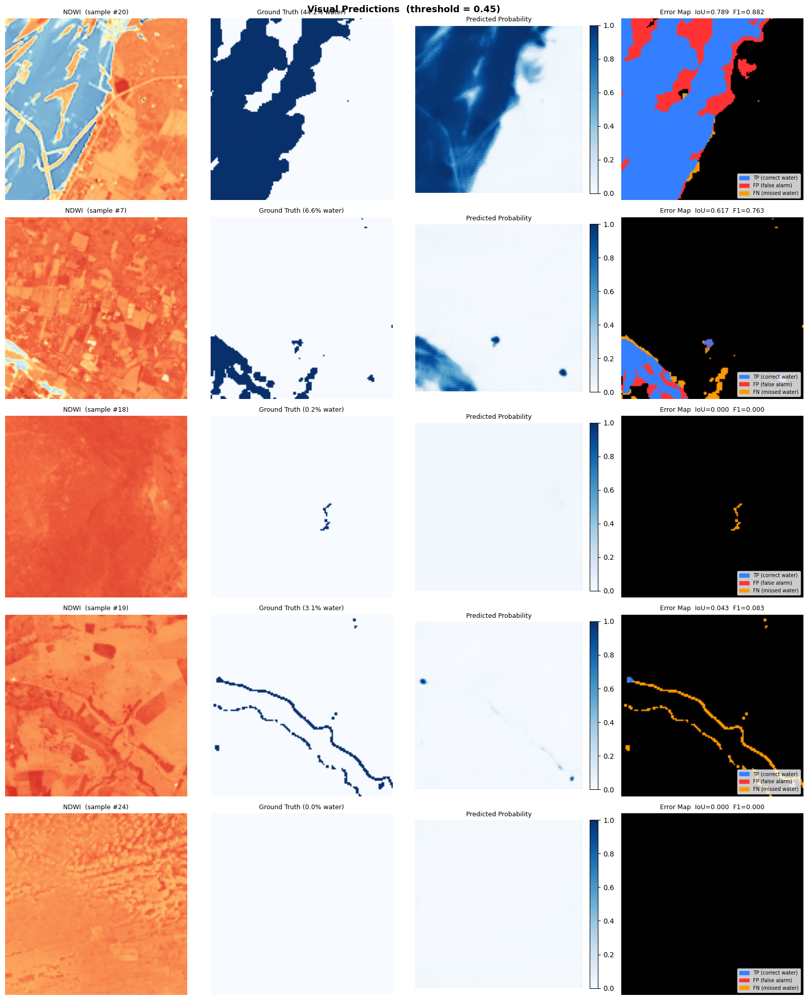

In [33]:
# BEST_THRESHOLD is already defined in 7.3 — no need to redefine it here
# BEST_THRESHOLD = float(best_thresh['Threshold'])  ← remove this line

def plot_predictions(X_test, Y_test, Y_pred_prob, n=5, threshold=0.5):
    # NOTE: default is 0.5 here because BEST_THRESHOLD may not exist at
    # function-definition time if cells run out of order.
    # We pass BEST_THRESHOLD explicitly when calling the function below.

    indices = np.random.choice(len(X_test), n, replace=False)

    fig, axes = plt.subplots(n, 4, figsize=(16, n * 4))
    if n == 1:
        axes = axes[np.newaxis, :]

    # Column headers
    for ax, title in zip(axes[0], ['NDWI Input', 'Ground Truth',
                                    'Predicted Probability', 'Error Map']):
        ax.set_title(title, fontsize=10, fontweight='bold', pad=10)

    for row, idx in enumerate(indices):
        # ── NDWI channel: index 12 (U-Net has 14 channels: 0–11 original, 12=NDWI, 13=MNDWI)
        ndwi_ch   = X_test[idx, :, :, 12]   # ← fixed from 14 (out of bounds) to 12
        pred_mask = (Y_pred_prob[idx, :, :, 0] > threshold).astype(float)
        gt_mask   = Y_test[idx, :, :, 0]
        prob_map  = Y_pred_prob[idx, :, :, 0]

        # Per-sample IoU
        inter      = (pred_mask * gt_mask).sum()
        union      = pred_mask.sum() + gt_mask.sum() - inter
        sample_iou = inter / (union + 1e-8)

        # Per-sample F1
        tp = ((pred_mask == 1) & (gt_mask == 1)).sum()
        fp = ((pred_mask == 1) & (gt_mask == 0)).sum()
        fn = ((pred_mask == 0) & (gt_mask == 1)).sum()
        sample_f1  = (2 * tp) / (2 * tp + fp + fn + 1e-8)

        # Col 0: NDWI
        axes[row, 0].imshow(ndwi_ch, cmap='RdYlBu', vmin=-1, vmax=1)
        axes[row, 0].set_title(f"NDWI  (sample #{idx})", fontsize=9)
        axes[row, 0].set_ylabel(f"Water: {gt_mask.mean():.1%}", fontsize=8)
        axes[row, 0].axis('off')

        # Col 1: Ground Truth
        axes[row, 1].imshow(gt_mask, cmap='Blues', vmin=0, vmax=1)
        axes[row, 1].set_title(f"Ground Truth ({gt_mask.mean():.1%} water)", fontsize=9)
        axes[row, 1].axis('off')

        # Col 2: Predicted Probability (with colorbar)
        im = axes[row, 2].imshow(prob_map, cmap='Blues', vmin=0, vmax=1)
        axes[row, 2].set_title("Predicted Probability", fontsize=9)
        axes[row, 2].axis('off')
        plt.colorbar(im, ax=axes[row, 2], fraction=0.046, pad=0.04)

        # Col 3: Error map — TP/FP/FN
        error_map = np.zeros((*gt_mask.shape, 3))
        tp_mask = (pred_mask == 1) & (gt_mask == 1)
        fp_mask = (pred_mask == 1) & (gt_mask == 0)
        fn_mask = (pred_mask == 0) & (gt_mask == 1)
        error_map[tp_mask] = [0.2, 0.5, 1.0]   # blue  = correct water
        error_map[fp_mask] = [1.0, 0.2, 0.2]   # red   = false alarm
        error_map[fn_mask] = [1.0, 0.6, 0.0]   # orange= missed water

        axes[row, 3].imshow(error_map)
        tp_p = mpatches.Patch(color=[0.2, 0.5, 1.0], label='TP (correct water)')
        fp_p = mpatches.Patch(color=[1.0, 0.2, 0.2], label='FP (false alarm)')
        fn_p = mpatches.Patch(color=[1.0, 0.6, 0.0], label='FN (missed water)')
        axes[row, 3].legend(handles=[tp_p, fp_p, fn_p],
                            loc='lower right', fontsize=7)
        axes[row, 3].set_title(f"Error Map  IoU={sample_iou:.3f}  F1={sample_f1:.3f}",
                               fontsize=9)
        axes[row, 3].axis('off')

    plt.suptitle(f'Visual Predictions  (threshold = {threshold:.2f})',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()


plot_predictions(X_test, Y_test, Y_pred_prob, n=5, threshold=BEST_THRESHOLD)

### 7.5 Failure Analysis

Mean  IoU across test samples : 0.4282
Median IoU                    : 0.5181
Std   IoU                     : 0.3705
Samples with IoU < 0.3        : 14
Samples with IoU > 0.8        : 4


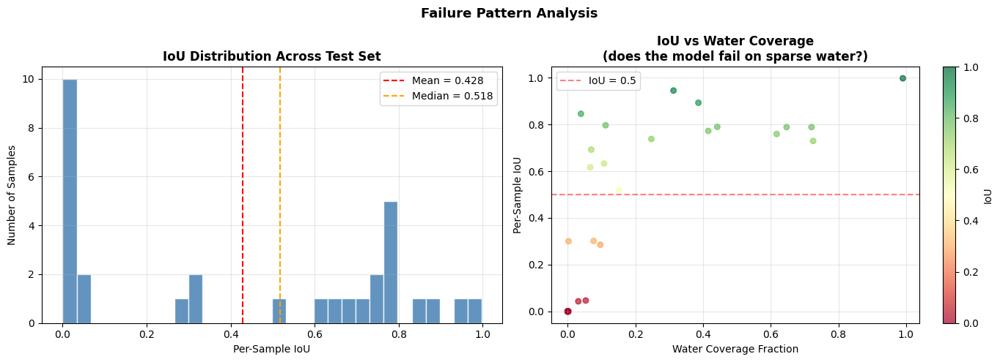


5 Worst Samples:
  sample #  4 | IoU=0.0000 | water_coverage=0.0%
  sample # 14 | IoU=0.0000 | water_coverage=0.0%
  sample # 13 | IoU=0.0000 | water_coverage=0.0%
  sample # 30 | IoU=0.0000 | water_coverage=0.0%
  sample # 24 | IoU=0.0000 | water_coverage=0.0%


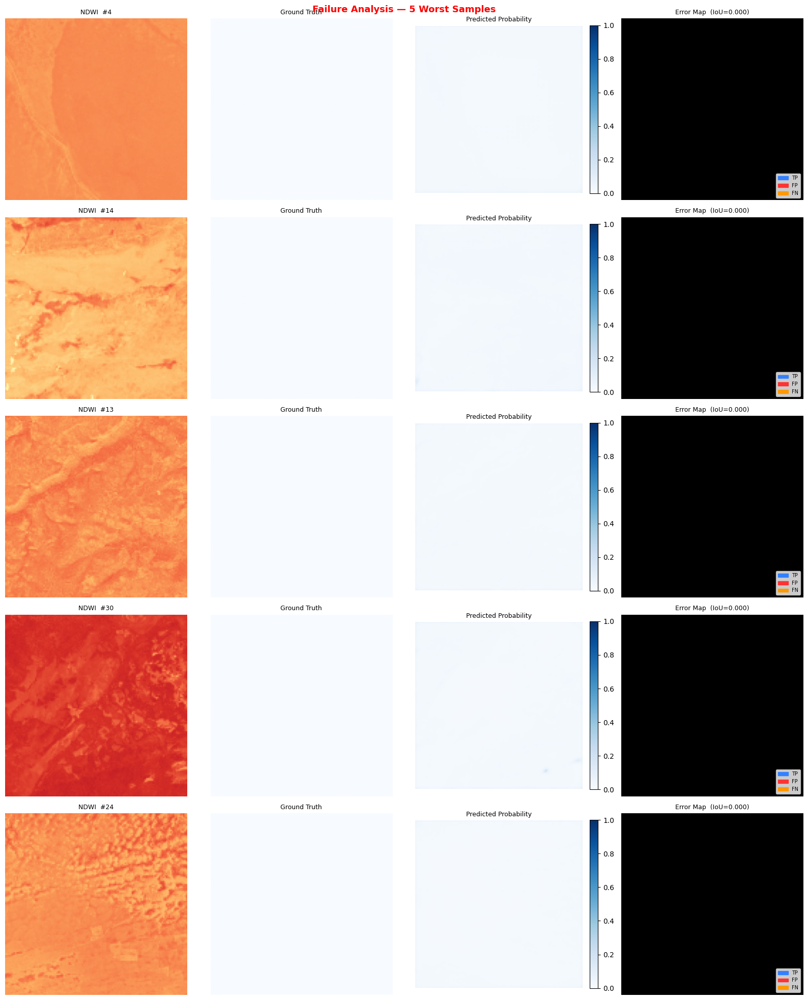


5 Best Samples:
  sample #  9 | IoU=0.9971 | water_coverage=99.0%
  sample # 29 | IoU=0.9448 | water_coverage=31.2%
  sample # 23 | IoU=0.8926 | water_coverage=38.6%
  sample # 15 | IoU=0.8454 | water_coverage=3.9%
  sample #  6 | IoU=0.7961 | water_coverage=11.2%


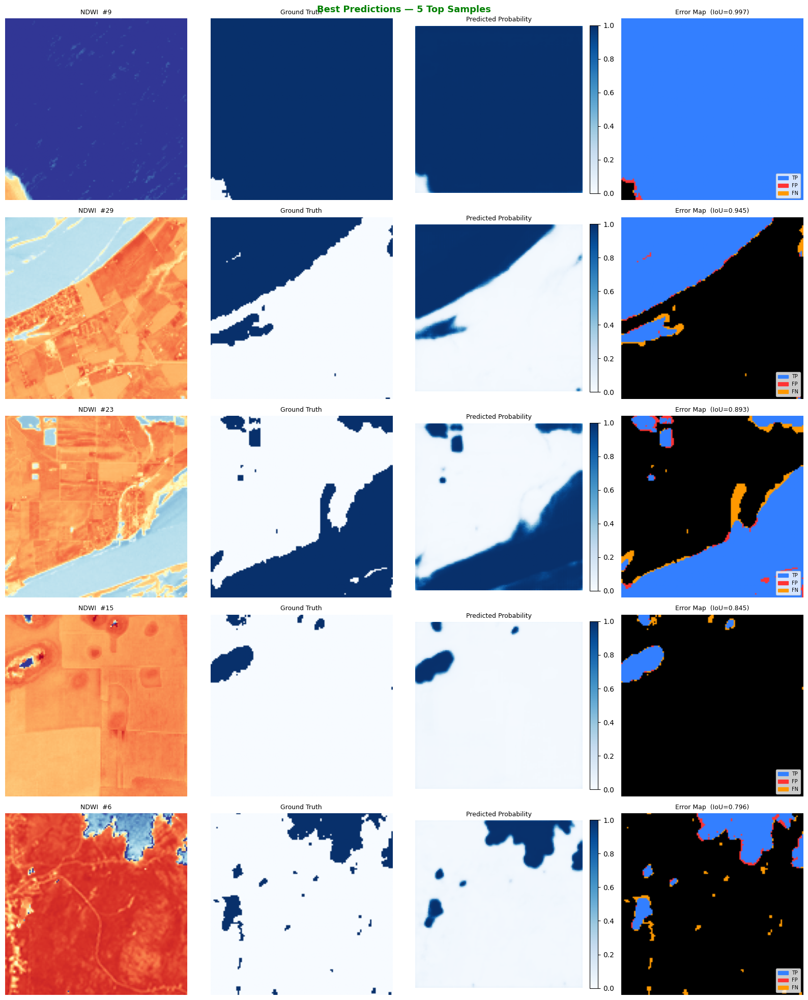

In [34]:
# Step 1: Compute per-sample IoU
per_sample_ious = []
for i in range(len(X_test)):
    pred  = (Y_pred_prob[i, :, :, 0] > BEST_THRESHOLD).astype(float)
    gt    = Y_test[i, :, :, 0]
    inter = (pred * gt).sum()
    union = pred.sum() + gt.sum() - inter
    per_sample_ious.append(inter / (union + 1e-8))

per_sample_ious = np.array(per_sample_ious)
water_coverage  = Y_test.squeeze().reshape(len(Y_test), -1).mean(axis=1)

print(f"Mean  IoU across test samples : {per_sample_ious.mean():.4f}")
print(f"Median IoU                    : {np.median(per_sample_ious):.4f}")
print(f"Std   IoU                     : {per_sample_ious.std():.4f}")
print(f"Samples with IoU < 0.3        : {(per_sample_ious < 0.3).sum()}")
print(f"Samples with IoU > 0.8        : {(per_sample_ious > 0.8).sum()}")

# Step 2: IoU distribution + failure pattern side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# IoU histogram
axes[0].hist(per_sample_ious, bins=30, color='steelblue',
             edgecolor='white', alpha=0.85)
axes[0].axvline(per_sample_ious.mean(), color='red', linestyle='--',
                label=f'Mean = {per_sample_ious.mean():.3f}')
axes[0].axvline(np.median(per_sample_ious), color='orange', linestyle='--',
                label=f'Median = {np.median(per_sample_ious):.3f}')
axes[0].set_xlabel('Per-Sample IoU')
axes[0].set_ylabel('Number of Samples')
axes[0].set_title('IoU Distribution Across Test Set', fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# IoU vs water coverage scatter
sc = axes[1].scatter(water_coverage, per_sample_ious,
                     c=per_sample_ious, cmap='RdYlGn',
                     vmin=0, vmax=1, alpha=0.7, s=30)
plt.colorbar(sc, ax=axes[1], label='IoU')
axes[1].set_xlabel('Water Coverage Fraction')
axes[1].set_ylabel('Per-Sample IoU')
axes[1].set_title('IoU vs Water Coverage\n(does the model fail on sparse water?)',
                  fontweight='bold')
axes[1].axhline(0.5, color='red', linestyle='--', alpha=0.5, label='IoU = 0.5')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.suptitle('Failure Pattern Analysis', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# Step 3: Worst 5 samples
worst_idx = np.argsort(per_sample_ious)[:5]
print("\n5 Worst Samples:")
for idx in worst_idx:
    print(f"  sample #{idx:3d} | IoU={per_sample_ious[idx]:.4f} "
          f"| water_coverage={water_coverage[idx]:.1%}")

fig, axes = plt.subplots(5, 4, figsize=(16, 20))
for row, idx in enumerate(worst_idx):
    ndwi_ch   = X_test[idx, :, :, 12]
    pred_mask = (Y_pred_prob[idx, :, :, 0] > BEST_THRESHOLD).astype(float)
    gt_mask   = Y_test[idx, :, :, 0]
    prob_map  = Y_pred_prob[idx, :, :, 0]

    error_map = np.zeros((*gt_mask.shape, 3))
    error_map[(pred_mask==1)&(gt_mask==1)] = [0.2, 0.5, 1.0]
    error_map[(pred_mask==1)&(gt_mask==0)] = [1.0, 0.2, 0.2]
    error_map[(pred_mask==0)&(gt_mask==1)] = [1.0, 0.6, 0.0]

    axes[row, 0].imshow(ndwi_ch, cmap='RdYlBu', vmin=-1, vmax=1)
    axes[row, 0].set_title(f'NDWI  #{idx}', fontsize=9)
    axes[row, 0].set_ylabel(f'IoU={per_sample_ious[idx]:.3f}\nwater={water_coverage[idx]:.1%}',
                            fontsize=8)
    axes[row, 0].axis('off')

    axes[row, 1].imshow(gt_mask, cmap='Blues', vmin=0, vmax=1)
    axes[row, 1].set_title('Ground Truth', fontsize=9)
    axes[row, 1].axis('off')

    im = axes[row, 2].imshow(prob_map, cmap='Blues', vmin=0, vmax=1)
    axes[row, 2].set_title('Predicted Probability', fontsize=9)
    axes[row, 2].axis('off')
    plt.colorbar(im, ax=axes[row, 2], fraction=0.046, pad=0.04)

    axes[row, 3].imshow(error_map)
    tp_p = mpatches.Patch(color=[0.2, 0.5, 1.0], label='TP')
    fp_p = mpatches.Patch(color=[1.0, 0.2, 0.2], label='FP')
    fn_p = mpatches.Patch(color=[1.0, 0.6, 0.0], label='FN')
    axes[row, 3].legend(handles=[tp_p, fp_p, fn_p], loc='lower right', fontsize=7)
    axes[row, 3].set_title(f'Error Map  (IoU={per_sample_ious[idx]:.3f})', fontsize=9)
    axes[row, 3].axis('off')

plt.suptitle('Failure Analysis — 5 Worst Samples',
             fontsize=13, fontweight='bold', color='red')
plt.tight_layout()
plt.show()

# Step 4: Best 5 samples (for contrast)
best_idx = np.argsort(per_sample_ious)[-5:][::-1]
print("\n5 Best Samples:")
for idx in best_idx:
    print(f"  sample #{idx:3d} | IoU={per_sample_ious[idx]:.4f} "
          f"| water_coverage={water_coverage[idx]:.1%}")

fig, axes = plt.subplots(5, 4, figsize=(16, 20))
for row, idx in enumerate(best_idx):
    ndwi_ch   = X_test[idx, :, :, 12]
    pred_mask = (Y_pred_prob[idx, :, :, 0] > BEST_THRESHOLD).astype(float)
    gt_mask   = Y_test[idx, :, :, 0]
    prob_map  = Y_pred_prob[idx, :, :, 0]

    error_map = np.zeros((*gt_mask.shape, 3))
    error_map[(pred_mask==1)&(gt_mask==1)] = [0.2, 0.5, 1.0]
    error_map[(pred_mask==1)&(gt_mask==0)] = [1.0, 0.2, 0.2]
    error_map[(pred_mask==0)&(gt_mask==1)] = [1.0, 0.6, 0.0]

    axes[row, 0].imshow(ndwi_ch, cmap='RdYlBu', vmin=-1, vmax=1)
    axes[row, 0].set_title(f'NDWI  #{idx}', fontsize=9)
    axes[row, 0].set_ylabel(f'IoU={per_sample_ious[idx]:.3f}\nwater={water_coverage[idx]:.1%}',
                            fontsize=8)
    axes[row, 0].axis('off')

    axes[row, 1].imshow(gt_mask, cmap='Blues', vmin=0, vmax=1)
    axes[row, 1].set_title('Ground Truth', fontsize=9)
    axes[row, 1].axis('off')

    im = axes[row, 2].imshow(prob_map, cmap='Blues', vmin=0, vmax=1)
    axes[row, 2].set_title('Predicted Probability', fontsize=9)
    axes[row, 2].axis('off')
    plt.colorbar(im, ax=axes[row, 2], fraction=0.046, pad=0.04)

    axes[row, 3].imshow(error_map)
    tp_p = mpatches.Patch(color=[0.2, 0.5, 1.0], label='TP')
    fp_p = mpatches.Patch(color=[1.0, 0.2, 0.2], label='FP')
    fn_p = mpatches.Patch(color=[1.0, 0.6, 0.0], label='FN')
    axes[row, 3].legend(handles=[tp_p, fp_p, fn_p], loc='lower right', fontsize=7)
    axes[row, 3].set_title(f'Error Map  (IoU={per_sample_ious[idx]:.3f})', fontsize=9)
    axes[row, 3].axis('off')

plt.suptitle('Best Predictions — 5 Top Samples',
             fontsize=13, fontweight='bold', color='green')
plt.tight_layout()
plt.show()